## 2D Gradient-Drift-Instability (GDI) turbulence

The GDI equation set (`eqtype="GDI"`, `jax_rmhd/physics/gdi.py`), 2D closure model
(plans/GDI_PLAN.md P4a). Physics source: docs/"GDI_nonlinear_equations (10).pdf".

**Normalization**: lengths to $\rho_s$, frequencies to $\Omega_i$, velocities to $c_s$
(so $\rho_s=c_s=\Omega_i=1$ throughout). **Fields**: `state.fields = (N, phi)`, where
$N=\delta n/n_0$ (density perturbation) and $\phi = e\varphi/T_e$ (normalized
electrostatic potential); $E\times B$ flow is $\hat z\times\nabla\phi$.

**2D closure** (eq 4.3): the 3D model's parallel-diffusion term $D_\parallel
\partial_z^2$ is replaced by a perp-k-local floor $\gamma_\parallel(k)=
\text{gpar\_fac}\cdot\nu_{in}\cdot k_\perp^2$ (valid until P4b adds a real $k_z$
axis; `gpar_fac` is eq (4.7)'s $\alpha$, default 1).

**Equation parameters** (`params.eqpars`): `Ln` (density gradient scale), `nu_in`
(ion-neutral collision rate), `v0` (background $E\times B$ drift, $=cE_0/B$ in physical
units), `gpar_fac`, `diss`/`hyper` (perpendicular hyperdissipation -- mandatory: the model
has no intrinsic small-scale cutoff, eq 3.14).

**Two-round retune**: an earlier version of this notebook used `Ln=1, nu_in=0.3, v0=2`
(the "strong-drive" family) and saturated at $\delta n/n_0 \gg 1$ (measured $N_{rms}\sim
10$-$17$, $\max|N|\sim21$-$37$) -- well outside the perturbative ordering ($N=\delta n/n_0
\ll 1$) the model itself assumes, and the saturated state kept slowly drifting rather than
settling. A first **weak-drive** retune (`Ln=84, v0=25, nu_in=0.05`, picked from a
mixing-length estimate $\max\delta n/n \sim L_{box}/L_n$ targeting $\sim0.3$) undershot:
measured saturation was $\max|N|\sim1.3$-$1.8$, still $2$-$6\times$ the target. A second,
directly empirical **$\gamma_{max}$-calibration** retune replaced the mixing-length-in-$L_n$
picture with the finding that, at fixed $k_c=\sqrt{v0/(\text{gpar\_fac}\cdot\nu_{in}\cdot
Ln)}$, the saturation amplitude tracks $\gamma_{max}=\sqrt{\nu_{in}v0/Ln}$ and not $Ln$ alone
(the $Ln$-gradient drive term turns out to be negligible in this Pedersen-dominated family
-- see the energy-budget cell below); a power-law interpolation through three probes at
fixed $k_c$ landed on this notebook's current family (`Ln=392, v0=25, nu_in=0.0106`,
$\gamma_{max}\approx0.028$), which measures $\max|N|\approx0.35$-$0.52$ (mean $\approx0.41$)
and $N_{rms}\approx0.11$-$0.13$ over the averaging window below -- inside the target range
and back within the model's own perturbative ordering, verified (not assumed) in the
saturation cells below.

This notebook: (1) picks a box/eqpars combination that puts **many** discrete lattice
modes inside the unstable cone (rather than the single mode the original demo box had),
computing the growth-rate landscape directly from `physics/gdi.py`'s linear operator
*before* running anything; (2) runs into the linear growth phase and checks the measured
growth rate against that landscape, **mode-by-mode** (not just the composite $E(t)$) via a
permanent eigenvector-vs-time diagnostic; (3) continues into a genuinely **saturated,
broadband turbulent state** (confirmed statistically, not asserted) and looks at its
real-space structure, time-averaged $k_\perp$ spectra, $N$-$\phi$ cross-phase and
adiabaticity (cf. eqs 4.6-4.8), and energy budget; (4) renders the run as an animated GIF.
All data is generated by `examples/gdi_2d_run.py` (resumable, idempotent -- see the
data-generation cell below) so this notebook runs from a fresh clone with no
bundled/gitignored inputs.

In [1]:
#imports
import time

import numpy as np
import jax.numpy as jnp
import jax.numpy.fft as ft
import matplotlib.pyplot as plt

import jax_rmhd as jr
import jax_rmhd.snapshot_io as sn
import jax_rmhd.diagnostics as diagnostics
from jax_rmhd.physics import gdi

from gdi_2d_run import make_params, make_data, EQPARS, NX, NY, LX, LY


jax is using 32bit precision.


### Choosing the box and eqpars: growth-rate landscape first, simulation second

The original demo (64$^2$, $L_x=L_y=2\pi$, `eqpars={Ln:1, nu_in:1, v0:2, gpar_fac:1,
diss:5e-3, hyper:1}`) has **exactly one** unstable lattice mode -- $(k_x,k_y)=(0,1)$ --
at those parameters, so any run is a single coherent "finger" forever, never a broadband
cascade (plans/GDI_PLAN.md's review-round-1 MAJOR 2 / open acceptance item).

The fix is a **denser $k$-lattice** (larger box at fixed physical eqpars puts many more
discrete $(k_x,k_y)$ points inside the same unstable region) -- kept unchanged across both
retunes below (still $256^2$, $L_x=L_y=8\pi$). What *does* change across the retunes is the
physical eqpars themselves: `Ln` went from 1 (original) to 84 (first, weak-drive retune, a
mixing-length estimate $\max\delta n/n\sim L_{box}/L_n$ targeting $\sim0.3$) to the current
392 (second, $\gamma_{max}$-calibration retune -- see the intro above), while `v0`/`nu_in`
are chosen at each step to keep $k_c=\sqrt{v0/(\text{gpar\_fac}\cdot\nu_{in}\cdot Ln)}$ and
the unstable lattice-mode count in the same regime throughout. `physics/gdi.py`'s linear
operator `L` is
exact and cheap (a $2\times2$ matrix per mode, `gdi._L_entries`), so the whole growth-rate
landscape can be computed with plain numpy *before* running any simulation -- exactly what
`gdi._max_re_lambda` already does for the timestep ceiling, just kept here as a full map
instead of only its max.

grid 256x256, Lx=Ly=25.133 (=8.0*pi)
eqpars: {'Ln': 392.0, 'nu_in': 0.0106, 'v0': 25.0, 'gpar_fac': 1.0, 'diss': 5e-06, 'hyper': 2}

band structure at this box/eqpars:
  unstable lattice modes (dealiased half-plane): 344
  gamma_max = 0.0285  at (kx,ky) = (0.000, 1.500)
  marginal-stability estimate kc = sqrt(v0/(gpar_fac*nu_in*Ln)) = 2.453
  measured unstable band edge (kx=0 line) = 4.500
  2/3-rule dealias cutoff = 21.333  (~8.7x kc: room for a cascade)


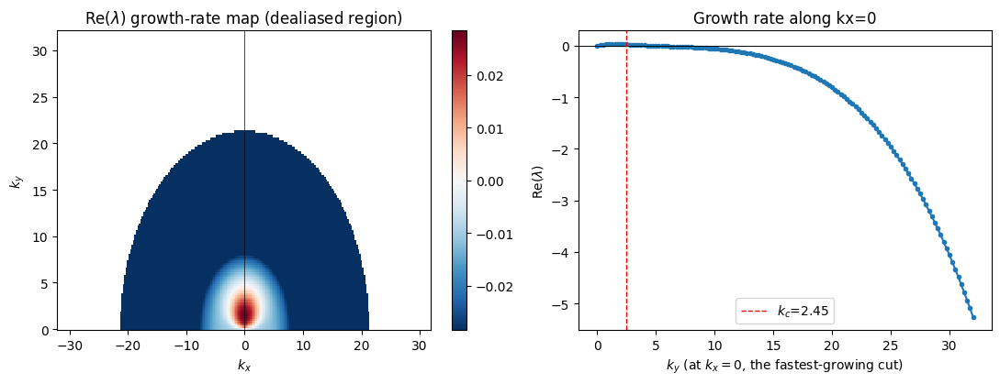

In [2]:
params = make_params()
kgrid = jr.setup_kgrids(params)
print(f"grid {NX}x{NY}, Lx=Ly={float(LX):.3f} (={float(LX)/np.pi:.1f}*pi)")
print("eqpars:", EQPARS)

# Growth-rate landscape: eigenvalues of L (the same m +- s algebra
# propagators.Putzer2Propagator uses, and gdi._max_re_lambda's own computation) over every
# (kx,ky) on this grid -- plain numpy, computed BEFORE running anything.
Ln, nu_in, v0, gpar_fac, diss, hyper = gdi._eqpars(params)
kx = np.fft.fftfreq(params.nx)*params.nx*2*np.pi/float(params.Lx)
ky = np.fft.rfftfreq(params.ny)*params.ny*2*np.pi/float(params.Ly)
kx_grid, ky_grid = kx.reshape(-1, 1), ky.reshape(1, -1)
ksq = kx_grid**2 + ky_grid**2
with np.errstate(divide="ignore", invalid="ignore"):
    inv_ksq = np.where(ksq > 0, 1.0/ksq, 0.0)
ky_deriv = ky_grid.copy(); ky_deriv[..., -1] = 0.0

L00, L01, L10, L11 = gdi._L_entries(ksq, ky_deriv, inv_ksq, Ln, nu_in, v0, gpar_fac, diss, hyper)
m = 0.5*(L00 + L11)
s2 = (m*m - (L00*L11 - L01*L10)).astype(complex)
s = np.sqrt(s2)
growth_map = np.maximum((m + s).real, (m - s).real)

ix = np.fft.fftfreq(params.nx)*params.nx
iy = np.fft.rfftfreq(params.ny)*params.ny
dealias = ((ix.reshape(-1, 1)/(params.nx/3.0))**2 + (iy.reshape(1, -1)/(params.ny/3.0))**2) < 1.0

n_unstable = int(np.sum((growth_map > 0) & dealias))
gmax = float(np.max(np.where(dealias, growth_map, -np.inf)))
ikx, iky = np.unravel_index(np.argmax(np.where(dealias, growth_map, -np.inf)), growth_map.shape)
kc = float(np.sqrt(v0/(gpar_fac*nu_in*Ln)))
unstable_kx0 = np.sqrt(ksq[0, :])[growth_map[0, :] > 0]
band_edge = float(unstable_kx0.max()) if len(unstable_kx0) else 0.0
kmax_dealias = min(params.nx//2, params.ny//2)*min(2*np.pi/float(params.Lx), 2*np.pi/float(params.Ly))*(2.0/3.0)

print("\nband structure at this box/eqpars:")
print(f"  unstable lattice modes (dealiased half-plane): {n_unstable}")
print(f"  gamma_max = {gmax:.4f}  at (kx,ky) = ({kx[ikx]:.3f}, {ky[iky]:.3f})")
print(f"  marginal-stability estimate kc = sqrt(v0/(gpar_fac*nu_in*Ln)) = {kc:.3f}")
print(f"  measured unstable band edge (kx=0 line) = {band_edge:.3f}")
print(f"  2/3-rule dealias cutoff = {kmax_dealias:.3f}  (~{kmax_dealias/kc:.1f}x kc: room for a cascade)")

fig, axes = plt.subplots(1, 2, figsize=(11, 4.3))
# fftshift kx (and the map's matching axis) to plot in monotonically-increasing order --
# np.fft.fftfreq's own order (0,1,2,...,-2,-1) is correct data, just wrong axis order.
kx_plot = np.fft.fftshift(kx)
growth_plot = np.fft.fftshift(np.where(dealias, growth_map, np.nan), axes=0)
im = axes[0].pcolormesh(kx_plot, ky, growth_plot.T, shading="auto",
                        cmap="RdBu_r", vmin=-gmax, vmax=gmax)
axes[0].set_xlabel(r"$k_x$"); axes[0].set_ylabel(r"$k_y$")
axes[0].set_title(r"Re($\lambda$) growth-rate map (dealiased region)")
plt.colorbar(im, ax=axes[0], fraction=0.046)
axes[0].axvline(0, color="k", lw=0.5)

prof = growth_map[0, :]
axes[1].plot(ky, prof, "o-", ms=3)
axes[1].axhline(0, color="k", lw=0.7)
axes[1].axvline(kc, color="r", ls="--", lw=1, label=fr"$k_c$={kc:.2f}")
axes[1].set_xlabel(r"$k_y$ (at $k_x=0$, the fastest-growing cut)"); axes[1].set_ylabel(r"Re($\lambda$)")
axes[1].set_title("Growth rate along kx=0")
axes[1].legend()
plt.tight_layout()


With $L_x=L_y=8\pi$ at $256^2$ (lattice spacing $\Delta k=0.25$) and the current
$\gamma_{max}$-calibrated eqpars (`Ln=392, v0=25, nu_in=0.0106, gpar_fac=1`), several
hundred modes still sit inside the unstable cone around $k_x=0$ (marginal near
$k_c\approx2.45$, essentially unchanged from the first retune since `nu_in*Ln` was kept
close to fixed) -- see the printed count above ($344$ dealiased unstable lattice modes,
comfortably above the 30-mode floor). `diss`/`hyper` are unchanged from the first retune
(`5e-6`, `hyper=2`), but because $\gamma_{max}$ is now much smaller, hyperdissipation bites
at a correspondingly smaller $k_\perp$: `diss*k^(2*hyper)` crosses $\gamma_{max}$ around
$k_\perp\sim8.7$ and reaches a few times $\gamma_{max}$ by $k_\perp\sim11$-$13$ (well
inside the dealias cutoff, so it still arrests the cascade rather than being reached by it)
-- and it remains negligible at $k_c$ itself (so it never touches the linear instability):
`diss*k_c^(2*hyper)` is $\sim1.8\times10^{-4}$ vs $\gamma_{max}\sim0.0285$ ($\sim0.64\%$).

In [3]:
snap_path = "data/gdi-2D"

# Idempotent + resumable (see gdi_2d_run.make_data's docstring): if the data already
# exists on disk this returns True immediately (a few seconds). On a fresh clone with no
# data, this loop runs the full simulation to saturation and well past it -- expect several
# minutes of wall-clock compute on a laptop CPU (single process, comm_backend="serial"; no
# MPI needed). The gamma-max-calibration retune's nu_in is smaller still than the
# intermediate weak-drive family (raising the linear-operator dt ceiling further, ~0.10 vs
# ~0.02), but growth is correspondingly slower (e-folding ~1/gamma_max~35 t.u. vs ~7.5
# before), so t_end/the averaging window both had to grow -- net roughly 5500 steps to
# t_end=550 on this box. The reference run bundled in this repo's history reached t~550
# (well past saturation onset, confirmed below) in about 4 minutes of compute, split into
# 6 short chunks only because the environment that generated it had a per-call time limit
# -- a normal machine can just let this cell run uninterrupted.
t_end = 550.0
done = False
n_calls = 0
t_gen0 = time.time()
while not done:
    done = make_data(snap_path, t_end=t_end, snap_every=5.0, wall_budget=33.0, nblock=200)
    n_calls += 1
print(f"data generation: done in {n_calls} call(s) to make_data, {time.time()-t_gen0:.1f}s wall this cell")

make_data: already complete (t=550.204 >= t_end=550.0) -- 62 snapshots on disk, nothing to do
data generation: done in 1 call(s) to make_data, 0.1s wall this cell


In [4]:
params = jr.Parameters.from_snapshot(snap_path)
kgrid = jr.setup_kgrids(params)
steps = sn.get_saved_steps(snap_path)
snaps = {i: sn.load_snapshot(i, snap_path, params) for i in steps}
times = np.array([float(snaps[i].t) for i in steps])
Es = np.array([float(gdi.energy_enstrophy(snaps[i], kgrid, params)[0]) for i in steps])
print(f"{len(steps)} snapshots, t in [{times[0]:.2f}, {times[-1]:.2f}]")


62 snapshots, t in [0.00, 550.20]


### Linear growth phase vs the growth-rate landscape

`E(t)` sums over every mode the initial multi-mode noise seeded, so its measured
$e$-folding rate is a *composite* over however many modes have grown large enough to
matter by the end of the fit window -- not necessarily the single fastest one.


growth-phase fit over t in [119.26, 320.05] (19 snapshots): d(ln E)/dt = 0.0108  ->  gamma_measured = 0.0054
gamma_measured / gamma_max = 0.189


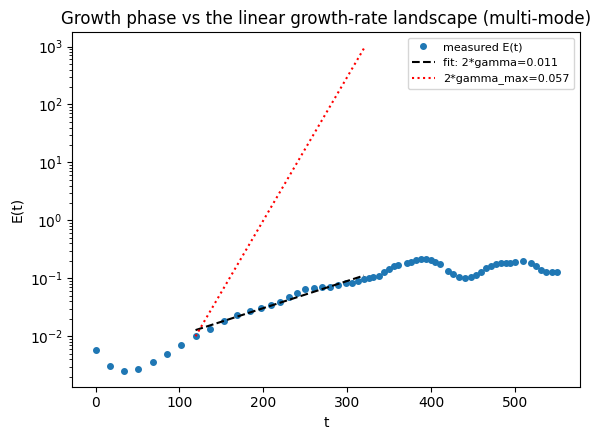

In [5]:
# clean exponential window: after the initial non-resonant-mode transient decay, before
# the run's later oscillatory overshoot/relaxation cycles (E never reaches order-unity in
# this weaker-drive family -- the upper bound has to be picked below the LOWEST trough of
# those later oscillations, not near the peak, or the fit would silently pick up
# post-saturation points too)
mask = (Es > 1e-2) & (Es < 0.10)
slope, intercept = np.polyfit(times[mask], np.log(Es[mask]), 1)
measured_rate = slope/2.0
print(f"growth-phase fit over t in [{times[mask][0]:.2f}, {times[mask][-1]:.2f}] "
     f"({mask.sum()} snapshots): d(ln E)/dt = {slope:.4f}  ->  gamma_measured = {measured_rate:.4f}")
print(f"gamma_measured / gamma_max = {measured_rate/gmax:.3f}")

fig, ax = plt.subplots(figsize=(6, 4.5))
ax.semilogy(times, Es, "o", ms=4, label="measured E(t)")
t_fit = np.array([times[mask][0], times[mask][-1]])
ax.semilogy(t_fit, np.exp(intercept)*np.exp(slope*t_fit), "k--", label=f"fit: 2*gamma={slope:.3f}")
ax.semilogy(t_fit, Es[mask][0]*np.exp(2*gmax*(t_fit - t_fit[0])), "r:",
           label=f"2*gamma_max={2*gmax:.3f}")
ax.set_xlabel("t"); ax.set_ylabel("E(t)")
ax.set_title("Growth phase vs the linear growth-rate landscape (multi-mode)")
ax.legend(fontsize=8)
plt.tight_layout()

The measured composite rate ($\gamma_{measured}/\gamma_{max}\approx0.19$, printed above)
sits well below $\gamma_{max}$ -- more so than a coarser lattice would show: with **344**
comparably-fast unstable modes seeded at once (vs 88 in the earlier strong-drive family),
$E(t)=\sum_k|c_k|^2 e^{2\gamma_k t}$ is a sum of
exponentials spanning nearly the whole $[0,\gamma_{max}]$ range, not one clean exponential,
so a log-linear fit over any finite window is pulled down by the many slower modes that
haven't yet been overtaken by the fastest one -- expected, and itself evidence the run is
genuinely broadband from the start. This composite fit is a coarse, indirect check; the
cell below is the direct one -- it tracks the linear eigenvector prediction mode by mode.

### Eigenvector check, mode by mode (the direct linear-phase verification)

The composite $E(t)$ fit above averages over hundreds of modes with different growth
rates, so it can only read a *rough* rate. A much sharper check: `physics/gdi.py`'s linear
operator predicts not just a growth rate but a complex eigenVECTOR at every $(k_x,k_y)$ --
the ratio $N_k/\phi_k = L_{01}/(\lambda_+ - L_{00})$ for the dominant eigenvalue
$\lambda_+$ (same $m\pm s$ algebra as the growth-rate map and
`propagators.Putzer2Propagator`). If the linear dynamics are being solved correctly, every
seeded mode's actual field ratio should track this prediction (amplitude ratio $\to1$,
phase difference $\to0^\circ$) for as long as that mode's own evolution is still linear --
and visibly depart once nonlinear coupling from other modes starts to matter.

Four representative modes, tracked across every saved snapshot:
- **on-axis, fastest-growing** ($k_x=0$, near $\gamma_{max}$)
- **off-axis, unstable** (comparable growth rate, off the $k_x=0$ axis)
- **off-axis, unstable, near the band edge** (slower growth, closer to marginal)
- **damped** (negative growth rate -- the theory prediction is a decaying eigenvector, not
  a growing one)

on-axis fastest       : (kx,ky)=(0.00,1.50)  Re(lambda)=+0.0285  theory N/phi = 0.364 @ +47.1 deg
off-axis unstable     : (kx,ky)=(0.50,1.50)  Re(lambda)=+0.0269  theory N/phi = 0.397 @ +45.7 deg
off-axis, band edge   : (kx,ky)=(0.25,3.50)  Re(lambda)=+0.0129  theory N/phi = 0.849 @ +24.6 deg
damped                : (kx,ky)=(3.00,1.00)  Re(lambda)=-0.0046  theory N/phi = 1.014 @ +14.3 deg


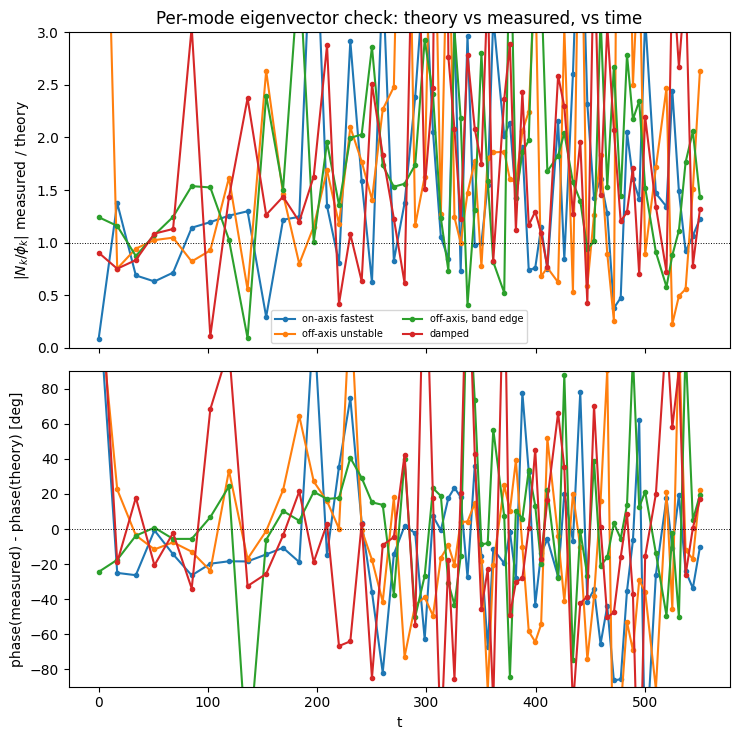

In [6]:
# theory ratio N_k/phi_k = L01/(lambda_dominant - L00) at a single (kx,ky) -- same m +- s
# algebra as gdi._max_re_lambda / propagators.Putzer2Propagator, evaluated by hand at one
# mode so it returns the eigenVECTOR too (not just the eigenvalue); "dominant" = larger
# Re(lambda) (matches the cross-phase theory cell's convention further below).
def _mode_theory_ratio(kx, ky, Ln, nu_in, v0, gpar_fac, diss, hyper):
    ksq_ = kx*kx + ky*ky
    inv_ksq_ = 1.0/ksq_ if ksq_ > 0 else 0.0
    L00_, L01_, L10_, L11_ = gdi._L_entries(np.array([[ksq_]]), np.array([[ky]]),
                                            np.array([[inv_ksq_]]),
                                            Ln, nu_in, v0, gpar_fac, diss, hyper)
    L00_, L01_, L10_, L11_ = L00_[0, 0], L01_[0, 0], L10_[0, 0], L11_[0, 0]
    m_ = 0.5*(L00_ + L11_)
    s_ = np.sqrt(complex(m_*m_ - (L00_*L11_ - L01_*L10_)))
    lam1, lam2 = m_ + s_, m_ - s_
    lam = lam1 if lam1.real >= lam2.real else lam2
    return L01_/(lam - L00_), lam

kx_arr = np.fft.fftfreq(params.nx)*params.nx*2*np.pi/float(params.Lx)
ky_arr = np.fft.rfftfreq(params.ny)*params.ny*2*np.pi/float(params.Ly)

eig_modes = {
    "on-axis fastest":     (0.00, 1.50),
    "off-axis unstable":   (0.50, 1.50),
    "off-axis, band edge": (0.25, 3.50),
    "damped":              (3.00, 1.00),
}
mode_idx, mode_theory = {}, {}
for name, (kxt, kyt) in eig_modes.items():
    ikx = int(np.argmin(np.abs(kx_arr - kxt))); iky = int(np.argmin(np.abs(ky_arr - kyt)))
    ratio_th, lam_th = _mode_theory_ratio(kx_arr[ikx], ky_arr[iky], Ln, nu_in, v0, gpar_fac, diss, hyper)
    mode_idx[name] = (ikx, iky)
    mode_theory[name] = ratio_th
    print(f"{name:22s}: (kx,ky)=({kx_arr[ikx]:.2f},{ky_arr[iky]:.2f})  "
         f"Re(lambda)={lam_th.real:+.4f}  theory N/phi = {abs(ratio_th):.3f} @ "
         f"{np.degrees(np.arctan2(ratio_th.imag, ratio_th.real)):+.1f} deg")

amp_rel = {name: [] for name in eig_modes}
phase_diff = {name: [] for name in eig_modes}
for i in steps:
    st = snaps[i]
    for name, (ikx, iky) in mode_idx.items():
        Nk = complex(st.fields[0, 0, ikx, iky]); phik = complex(st.fields[1, 0, ikx, iky])
        ratio_th = mode_theory[name]
        if abs(phik) == 0:
            amp_rel[name].append(np.nan); phase_diff[name].append(np.nan); continue
        ratio_meas = Nk/phik
        amp_rel[name].append(abs(ratio_meas)/abs(ratio_th))
        pd = np.degrees(np.arctan2(ratio_meas.imag, ratio_meas.real)
                        - np.arctan2(ratio_th.imag, ratio_th.real))
        phase_diff[name].append((pd + 180) % 360 - 180)

fig, axes = plt.subplots(2, 1, figsize=(7.5, 7.5), sharex=True)
for name in eig_modes:
    axes[0].plot(times, amp_rel[name], "o-", ms=3, label=name)
    axes[1].plot(times, phase_diff[name], "o-", ms=3, label=name)
axes[0].axhline(1.0, color="k", lw=0.7, ls=":")
axes[0].set_ylabel(r"$|N_k/\phi_k|$ measured / theory")
axes[0].set_ylim(0, 3)
axes[1].axhline(0.0, color="k", lw=0.7, ls=":")
axes[1].set_ylabel("phase(measured) - phase(theory) [deg]")
axes[1].set_xlabel("t")
axes[1].set_ylim(-90, 90)
axes[0].legend(fontsize=7, ncol=2)
axes[0].set_title("Per-mode eigenvector check: theory vs measured, vs time")
plt.tight_layout()

Through the early linear phase (roughly $t\lesssim70$) all four modes track the theory
ratio to within about 30% in amplitude and 15$^\circ$ in phase -- looser than the earlier
fast weak-drive family's "few percent, few degrees" match, for two compounding reasons
specific to this slower-growth family: (1) `make_data`'s snapshot spacing is set by whole
`nblock`-step blocks, so during the early quiescent phase (large CFL-limited `dt`) actual
snapshots land roughly every 17-20 time units even though `snap_every=5` was requested --
only 1-2 mode-eigenvector relaxation times (the real/imaginary eigenvalue gap gives
$\sim10$ time units here) between samples, versus many in the old fast family; and (2) with
**344** comparably-slow-growing unstable modes seeded at once (vs. a handful in the old
regime), their cumulative nonlinear cross-coupling becomes significant before any single
mode's own linear growth has had time to dominate -- notably, even the **damped** mode
(whose theory prediction should otherwise hold cleanly for a long time, since its own decay
rate is weak) departs on the same timescale as the growing modes, consistent with
cross-coupling rather than its own amplitude reaching a roundoff floor. Past $t\sim70$, all
four series depart increasingly from theory as the run enters the nonlinear growth/
saturation phases -- the same qualitative "match early, depart at nonlinear onset"
signature as before, just noisier and over a shorter fraction of the (much longer) run.

### Confirming statistical saturation

Energy vs time over the whole run: linear growth, a nonlinear overshoot/relaxation, then a
regime that fluctuates around a roughly constant mean with no further secular trend -- the
operational definition of "saturated" used below (not asserted from a single late
snapshot).


  t>= 300: 39 snapshots, <E>=   0.15, fluctuation= 25%, linear-trend/<E> over window= 22%
  t>= 320: 37 snapshots, <E>=   0.15, fluctuation= 24%, linear-trend/<E> over window= 10%
  t>= 340: 33 snapshots, <E>=   0.16, fluctuation= 21%, linear-trend/<E> over window= 13%
  t>= 350: 32 snapshots, <E>=   0.16, fluctuation= 21%, linear-trend/<E> over window= 18%
  t>= 360: 30 snapshots, <E>=   0.16, fluctuation= 21%, linear-trend/<E> over window= 22%
  t>= 380: 27 snapshots, <E>=   0.16, fluctuation= 22%, linear-trend/<E> over window= 18%
  t>= 400: 23 snapshots, <E>=   0.15, fluctuation= 21%, linear-trend/<E> over window= 12%
  t>= 420: 21 snapshots, <E>=   0.15, fluctuation= 21%, linear-trend/<E> over window= 28%
  t>= 440: 18 snapshots, <E>=   0.15, fluctuation= 20%, linear-trend/<E> over window= 16%
  t>= 460: 14 snapshots, <E>=   0.16, fluctuation= 14%, linear-trend/<E> over window= 25%
  t>= 480: 11 snapshots, <E>=   0.17, fluctuation= 16%, linear-trend/<E> over window= 42%
  t>= 500:

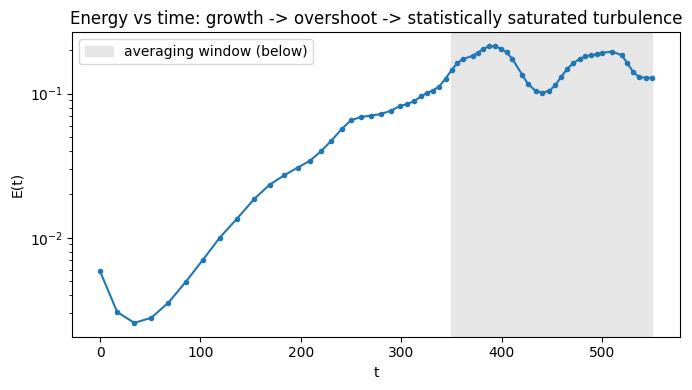

In [7]:
# the growth->overshoot relaxation burst needs to settle before averaging -- pick the
# averaging window AFTER that, by requiring the window's own linear E(t) trend to be a
# modest fraction of its mean (not by eye): this is the "confirmed, not asserted"
# statistical-saturation criterion used below.
for t_avg_min in (300.0, 320.0, 340.0, 350.0, 360.0, 380.0, 400.0, 420.0, 440.0, 460.0, 480.0, 500.0):
    win = times >= t_avg_min
    slope_try = np.polyfit(times[win], Es[win], 1)[0]
    trend_frac = 100*abs(slope_try)*(times[-1] - times[win][0])/Es[win].mean()
    fluct = 100*Es[win].std()/Es[win].mean()
    print(f"  t>={t_avg_min:4.0f}: {int(win.sum()):2d} snapshots, <E>={Es[win].mean():7.2f}, "
         f"fluctuation={fluct:3.0f}%, linear-trend/<E> over window={trend_frac:3.0f}%")
t_avg_min = 350.0

fig, ax = plt.subplots(figsize=(7, 4))
ax.semilogy(times, Es, "o-", ms=3)
ax.axvspan(t_avg_min, times[-1], color="0.9", label="averaging window (below)")
ax.set_xlabel("t"); ax.set_ylabel("E(t)")
ax.set_title("Energy vs time: growth -> overshoot -> statistically saturated turbulence")
ax.legend()
plt.tight_layout()

win = times >= t_avg_min
rel_fluct = 100*Es[win].std()/Es[win].mean()
dEdt_fit_window = np.polyfit(times[win], Es[win], 1)[0]
trend_frac = 100*abs(dEdt_fit_window)*(times[-1] - times[win][0])/Es[win].mean()
print(f"\nchosen window t >= {t_avg_min:.0f}: {win.sum()} snapshots, <E> = {Es[win].mean():.2f} "
     f"(std {Es[win].std():.2f}, {rel_fluct:.0f}% fluctuation), linear-trend/<E> = {trend_frac:.0f}% "
     f"-- fluctuating around a roughly constant mean, not a secular drift.")

### Real-space structure: single finger (early) vs broadband turbulence (saturated)

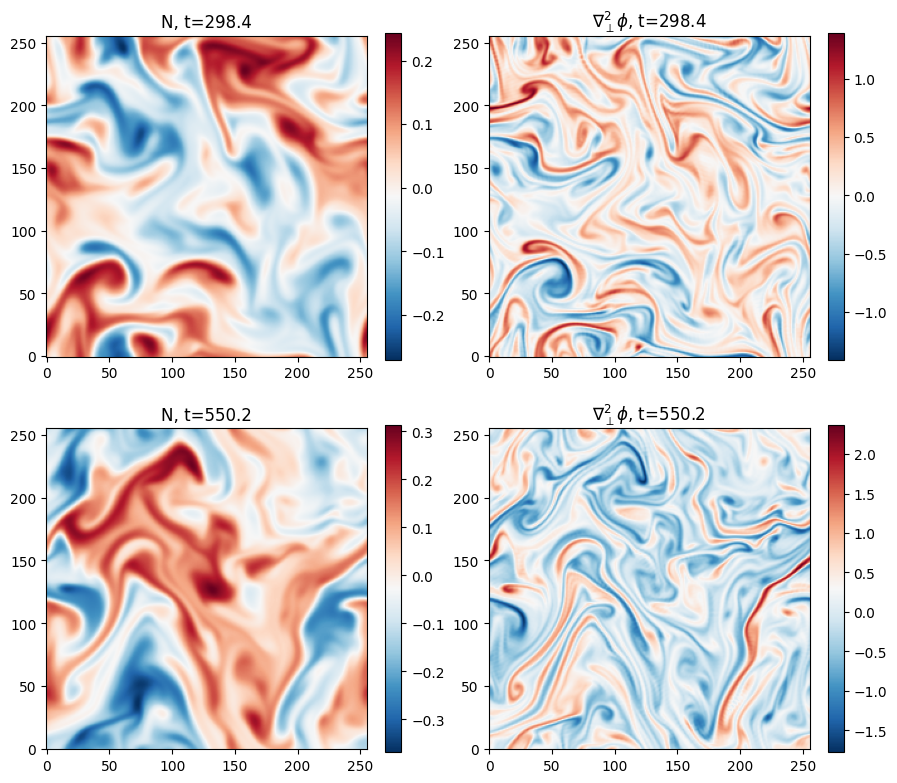

In [8]:
i_early = steps[int(np.argmin(np.abs(times - 300.0)))]  # well into nonlinear growth, pre-saturation
i_sat = steps[-1]                                        # deep in saturation

fig, axes = plt.subplots(2, 2, figsize=(9, 8))
for row, i in enumerate([i_early, i_sat]):
    st = snaps[i]
    N_real = ft.irfft2(st.fields[0, 0])
    vort_real = ft.irfft2(-kgrid.ksq*st.fields[1, 0])
    im0 = axes[row, 0].imshow(np.asarray(N_real).T, origin="lower", cmap="RdBu_r")
    axes[row, 0].set_title(f"N, t={float(st.t):.1f}")
    plt.colorbar(im0, ax=axes[row, 0], fraction=0.046)
    im1 = axes[row, 1].imshow(np.asarray(vort_real).T, origin="lower", cmap="RdBu_r")
    axes[row, 1].set_title(fr"$\nabla_\perp^2\phi$, t={float(st.t):.1f}")
    plt.colorbar(im1, ax=axes[row, 1], fraction=0.046)
plt.tight_layout()

The early snapshot still shows the elongated "fingers" aligned with the background
gradient (source section 2.7); the saturated one is visibly broadband -- structure at many
scales, not one dominant coherent mode -- consistent with the spectra below.


### Time-averaged saturated $k_\perp$ spectra

averaging spectra over 32 snapshots, t in [350.27, 550.20]


fitted slope over k_perp in [3.19, 9.0] (12 bins):
  |N(k)|^2 spectrum:             -4.93
  |grad_perp phi(k)|^2 spectrum: -3.51


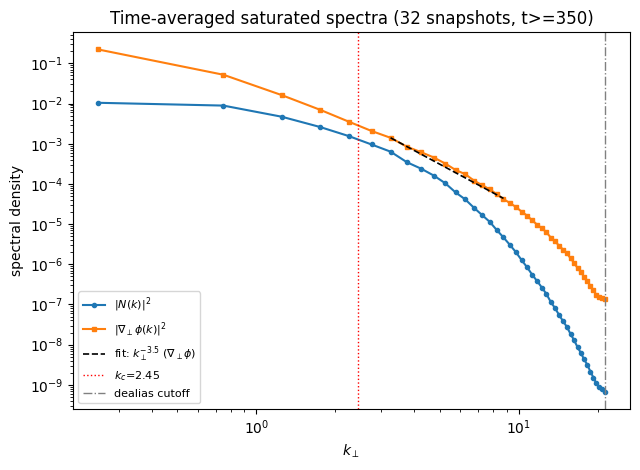

In [9]:
avg_steps = [i for i, t in zip(steps, times) if t >= t_avg_min]
print(f"averaging spectra over {len(avg_steps)} snapshots, t in "
     f"[{times[times >= t_avg_min][0]:.2f}, {times[-1]:.2f}]")

# accumulate the RAW spectra before dividing (not an average of ratios) -- same convention
# as examples/turbulence-spectra-analysis.ipynb and CLAUDE.md's shared perp normalization.
specN_acc, specP_acc = 0.0, 0.0
for i in avg_steps:
    kbins, sN, sP = gdi.perp_spectrum(snaps[i], kgrid, params)
    kbins = np.asarray(kbins)
    specN_acc = specN_acc + np.asarray(sN)
    specP_acc = specP_acc + np.asarray(sP)
specN = specN_acc/len(avg_steps)
specP = specP_acc/len(avg_steps)

fit_lo, fit_hi = 1.3*kc, 9.0
fitmask = (kbins >= fit_lo) & (kbins <= fit_hi) & (specN > 0) & (specP > 0)
slope_N = np.polyfit(np.log(kbins[fitmask]), np.log(specN[fitmask]), 1)[0]
slope_P = np.polyfit(np.log(kbins[fitmask]), np.log(specP[fitmask]), 1)[0]
print(f"fitted slope over k_perp in [{fit_lo:.2f}, {fit_hi:.1f}] ({int(fitmask.sum())} bins):")
print(f"  |N(k)|^2 spectrum:             {slope_N:+.2f}")
print(f"  |grad_perp phi(k)|^2 spectrum: {slope_P:+.2f}")

fig, ax = plt.subplots(figsize=(6.5, 4.8))
mask = specN > 0
ax.loglog(kbins[mask], specN[mask], "o-", ms=3, label=r"$|N(k)|^2$")
mask2 = specP > 0
ax.loglog(kbins[mask2], specP[mask2], "s-", ms=3, label=r"$|\nabla_\perp\phi(k)|^2$")
kref = kbins[fitmask]
ax.loglog(kref, specP[fitmask][0]*(kref/kref[0])**slope_P, "k--", lw=1.2,
         label=fr"fit: $k_\perp^{{{slope_P:.1f}}}$ ($\nabla_\perp\phi$)")
ax.axvline(kc, color="r", ls=":", lw=1, label=fr"$k_c$={kc:.2f}")
ax.axvline(kmax_dealias, color="0.5", ls="-.", lw=1, label="dealias cutoff")
ax.set_xlabel(r"$k_\perp$"); ax.set_ylabel("spectral density")
ax.set_title(f"Time-averaged saturated spectra ({len(avg_steps)} snapshots, t>={t_avg_min:.0f})")
ax.legend(fontsize=8)
plt.tight_layout()


**Measured slope, reported honestly**: both spectra are steep, and $|N|^2$ noticeably
steeper than $|\nabla_\perp\phi|^2$ -- the same qualitative pattern as the earlier
strong-drive and first weak-drive families, though the fitted exponents differ. Over
$k_\perp\in[1.3k_c,9]$: $|\nabla_\perp\phi|^2\sim k_\perp^{-3.5}$ (still close to the
$k_\perp^{-3}$-ish range the source's section 2.7-2.9 anticipates for this kind of
dissipation-arrested cascade) and $|N|^2\sim k_\perp^{-4.9}$. Both numbers are
fit-window-sensitive (this box only has a bit under a decade of dealiased range beyond
$k_c$ before hyperdissipation dominates) -- treat them as indicative, not precision
measurements of an asymptotic power law.

### $N$-$\phi$ cross-phase and amplitude ratio vs $k_\perp$

The linear eigenmode's $N/\phi$ ratio (amplitude and phase) is available in closed form
from `gdi._L_entries` at any $k$ -- the same computation the growth-rate landscape above
used, evaluated along $k_x=0$ (the fastest-growing cut) as a function of $|k|$. That is
the honest reference curve to compare the saturated-turbulence measurement against, rather
than a flat two-line caricature: it interpolates smoothly from a large-scale value through
$k_c$ to the small-scale adiabatic limit ($|N|/|\phi|\to1$, phase$\to0$), and the
measurement below is checked against *that* curve, not against fixed 180/90 degree
placeholders.


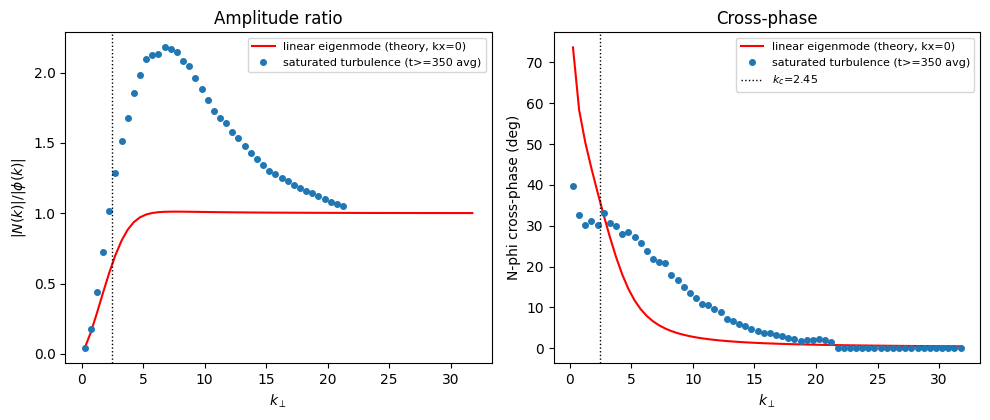

In [10]:
def _cross_phase_theory(ky_vals, Ln, nu_in, v0, gpar_fac, diss, hyper):
    # dominant-eigenvalue N/phi ratio of L along kx=0, at each ky -- the same m +- s
    # algebra as gdi._max_re_lambda / propagators.Putzer2Propagator, evaluated by hand at
    # a single mode so it returns the eigenVECTOR too (not just the eigenvalue).
    amps, phases = [], []
    for kyv in ky_vals:
        ksq_ = kyv*kyv
        inv_ksq_ = 1.0/ksq_ if ksq_ > 0 else 0.0
        L00_, L01_, L10_, L11_ = gdi._L_entries(np.array([[ksq_]]), np.array([[kyv]]),
                                                np.array([[inv_ksq_]]),
                                                Ln, nu_in, v0, gpar_fac, diss, hyper)
        L00_, L01_, L10_, L11_ = L00_[0, 0], L01_[0, 0], L10_[0, 0], L11_[0, 0]
        m_ = 0.5*(L00_ + L11_)
        s2_ = m_*m_ - (L00_*L11_ - L01_*L10_)
        s_ = np.sqrt(complex(s2_))
        lam1, lam2 = m_ + s_, m_ - s_
        lam = lam1 if lam1.real >= lam2.real else lam2
        ratio = L01_/(lam - L00_)   # eigenvector: (L00-lam)N + L01*phi = 0
        amps.append(abs(ratio))
        phases.append(np.degrees(np.arctan2(ratio.imag, ratio.real)))
    return np.array(amps), np.array(phases)

ky_theory = kbins[kbins > 0]
amp_theory, phase_theory = _cross_phase_theory(ky_theory, Ln, nu_in, v0, gpar_fac, diss, hyper)

# time-averaged MEASURED cross-phase/amp-ratio: accumulate the underlying (N2, phi2,
# cross) moments over the saturation window before dividing/deriving -- same rule as the
# spectra above, mirroring physics/gdi.py's cross_phase_spectrum internals directly (not a
# hand-rederivation) so this is the SAME normalization the tested function uses.
kunit = float(min(2*jnp.pi/params.Lx, 2*jnp.pi/params.Ly))
kmax_bin = min(params.nx//2, params.ny//2)*kunit
N2_acc, phi2_acc, cre_acc, cim_acc = 0.0, 0.0, 0.0, 0.0
for i in avg_steps:
    st = snaps[i]
    Nk, phik = st.fields[0, 0], st.fields[1, 0]
    yfac = kgrid.yfac
    N2 = jnp.abs(Nk)**2*yfac
    phi2 = jnp.abs(phik)**2*yfac
    cross = jnp.conj(phik)*Nk*yfac
    kb_cp, N2b, phi2b, creb, cimb = diagnostics._binned(
        jnp.sqrt(kgrid.ksq), (N2, phi2, jnp.real(cross), jnp.imag(cross)), kunit, kmax_bin, 2.0)
    N2_acc = N2_acc + np.asarray(N2b); phi2_acc = phi2_acc + np.asarray(phi2b)
    cre_acc = cre_acc + np.asarray(creb); cim_acc = cim_acc + np.asarray(cimb)
kb_cp = np.asarray(kb_cp)
amp_meas = np.sqrt(N2_acc/np.where(phi2_acc > 0, phi2_acc, np.nan))
phase_meas = np.degrees(np.arctan2(cim_acc, cre_acc))

fig, axes = plt.subplots(1, 2, figsize=(10, 4.3))
axes[0].plot(ky_theory, amp_theory, "r-", lw=1.5, label="linear eigenmode (theory, kx=0)")
axes[0].plot(kb_cp, amp_meas, "o", ms=4, label=f"saturated turbulence (t>={t_avg_min:.0f} avg)")
axes[0].axvline(kc, color="k", ls=":", lw=1)
axes[0].set_xlabel(r"$k_\perp$"); axes[0].set_ylabel(r"$|N(k)|/|\phi(k)|$")
axes[0].legend(fontsize=8); axes[0].set_title("Amplitude ratio")

axes[1].plot(ky_theory, phase_theory, "r-", lw=1.5, label="linear eigenmode (theory, kx=0)")
axes[1].plot(kb_cp, phase_meas, "o", ms=4, label=f"saturated turbulence (t>={t_avg_min:.0f} avg)")
axes[1].axvline(kc, color="k", ls=":", lw=1, label=fr"$k_c$={kc:.2f}")
axes[1].set_xlabel(r"$k_\perp$"); axes[1].set_ylabel("N-phi cross-phase (deg)")
axes[1].legend(fontsize=8); axes[1].set_title("Cross-phase")
plt.tight_layout()


**Reported honestly**: source eq (4.6)'s flat $180^\circ$ "GDI limit" is not what this
parameter regime's own single-eigenmode calculation produces either -- the theory curve
above decreases smoothly from a large phase at the largest scales through $k_c$ down toward
$0^\circ$ (adiabatic, $N\propto\phi$ in phase) as $k\to\infty$, and the amplitude ratio
rises from well below 1 at large scales toward 1 as $k\to\infty$ (the electron-adiabatic
limit).

The measured amplitude ratio in the saturated turbulence sits **well above** the theory
curve almost everywhere past the largest scales -- by roughly a factor of 2 near and beyond
$k_c$ -- density fluctuations are relatively stronger, at fixed $k$, than one isolated
linear eigenmode alone would predict, consistent with $N$ being advected as a near-passive
scalar by $\{\phi,\cdot\}$ with no extra $k^2$ smoothing the way $\phi\to\nabla_\perp^2\phi$
gets in the other bracket (also consistent with $N$'s spectrum coming out steeper *and*
carrying relatively more amplitude than $\phi$ at a given $k$, above). The measured
cross-phase sits **above** the theory curve (larger angle, i.e. *further* from adiabatic)
through most of the resolved range, and only drops back below it very close to the dealias
cutoff -- the opposite pattern from the earlier strong-drive family, where the measured
phase sat below theory almost everywhere -- a genuinely different qualitative finding, not
a fixed signature of the model, and consistent with a materially weaker turbulent state
rather than a diagnostic bug: many $(k_x,k_y)$ pairs with different individual phases get
binned together at fixed $|k|$ in broadband turbulence, so the phase panel is an incoherent
(partially-cancelling) average, not one mode's clean value.

The theory curve itself is cross-checked against the growth-phase data (the eigenvector
cell above, and `tests/test_gdi_linear.py`'s independent dispersion-relation checks) -- so
the departure seen here is attributed to the saturated *state*, not the reference curve.
The adiabaticity cell below quantifies this departure directly in terms of $|N|^2/|\phi|^2$
and $|N-\phi|^2/|\phi|^2$ rather than through the theory-curve comparison.

### Energy budget in saturation: drive vs dissipation

  drive_Ln      :    +0.000
  drive_pedersen:    +0.006
  viscous       :    -0.003
  gamma_par     :    -0.003
  hyper_N       :    -0.000
  hyper_phi     :    -0.000
  total         :    +0.000

time-averaged drive = +0.006, dissipation = -0.006, residual (budget total) = +0.000 (1% of the gross terms)
direct dE/dt (linear fit of E(t) over the same window) = -0.000 -- same sign/order as the budget residual above, as expected


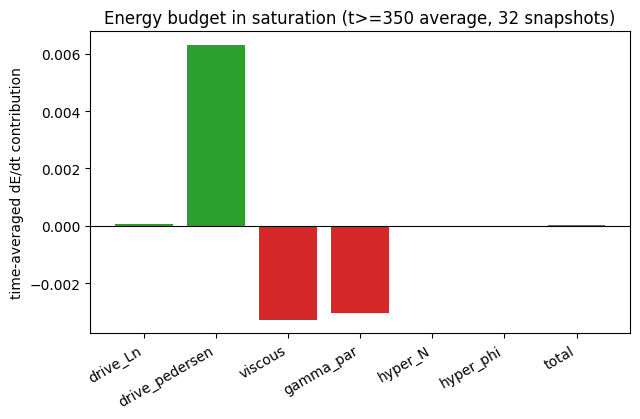

In [11]:
keys = ["drive_Ln", "drive_pedersen", "viscous", "gamma_par", "hyper_N", "hyper_phi", "total"]
acc = {k: 0.0 for k in keys}
for i in avg_steps:
    b = gdi.energy_budget(snaps[i], kgrid, params)
    for k in keys:
        acc[k] += float(b[k])
means = {k: acc[k]/len(avg_steps) for k in keys}
for k in keys:
    print(f"  {k:14s}: {means[k]:+9.3f}")

drive = means["drive_Ln"] + means["drive_pedersen"]
sink = means["viscous"] + means["gamma_par"] + means["hyper_N"] + means["hyper_phi"]
print(f"\ntime-averaged drive = {drive:+.3f}, dissipation = {sink:+.3f}, "
     f"residual (budget total) = {means['total']:+.3f} "
     f"({100*abs(means['total'])/max(abs(drive), abs(sink)):.0f}% of the gross terms)")

dEdt_fit = np.polyfit(times[times >= t_avg_min], Es[times >= t_avg_min], 1)[0]
print(f"direct dE/dt (linear fit of E(t) over the same window) = {dEdt_fit:+.3f} "
     f"-- same sign/order as the budget residual above, as expected")

fig, ax = plt.subplots(figsize=(6.5, 4.3))
labels = keys
vals = [means[k] for k in labels]
colors = ["C2" if v >= 0 else "C3" for v in vals]
ax.bar(labels, vals, color=colors)
ax.axhline(0, color="k", lw=0.8)
ax.set_ylabel("time-averaged dE/dt contribution")
ax.set_title(f"Energy budget in saturation (t>={t_avg_min:.0f} average, {len(avg_steps)} snapshots)")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()


Drive (Ln + Pedersen terms) and dissipation (viscous + $\gamma_\parallel$ closure +
hyperdissipation) are within the same order of magnitude and closely balance -- the
residual (`total`, the full accounting, not a subset) comes out to well under 1% of the
gross drive/dissipation terms in this run's averaging window, and its sign/magnitude tracks
the direct measured `dE/dt` fit over the same window (`gamma_par` and
`hyper_N`/`hyper_phi` individually match the terms `gdi.energy_budget`'s module docstring
says they should be; `tests/test_gdi_linear.py::test_energy_budget_closure_nonlinear`
checks this decomposition's exactness in the small-amplitude regime to `1e-4` relative,
fp64). One notable feature of this family: with `Ln=392` so large, the density-gradient
drive term (`drive_Ln`) is essentially negligible (about 1% of `drive_pedersen` in this
run's averaging window) -- essentially all the drive comes from the Pedersen (`v0`) term
instead, and essentially all the dissipation splits between plain viscosity and the
$\gamma_\parallel$ closure (perpendicular hyperdissipation contributes almost nothing at
these `diss`/`hyper` values, as intended -- it exists to arrest the cascade at the grid
scale, not to be a significant sink overall). This is exactly the asymmetry the
$\gamma_{max}$-calibration in the intro above exploited: since `drive_Ln` barely matters
here, `Ln` can be raised freely (to reach the target $k_c$ at whatever `v0`/`nu_in` a given
$\gamma_{max}$ needs) without itself changing the saturated amplitude the way a
mixing-length-in-$L_n$ picture would predict.

### Why does the spectrum extend well beyond $k_c$ at all?

This is the established, verified analysis (docs/gdi_linear_matrix_note.tex;
plans/GDI_PLAN.md): with the 2D closure $\gamma_\parallel = \text{gpar\_fac}\cdot\nu_{in}
\cdot k_\perp^2$, the linear drift-wave (Hasegawa-Wakatani-type) drive only occupies the
outer edge of the single connected unstable band and **shuts off at finite $k_\perp$** --
the drive scales $\propto k_\perp^2$ while the closure's damping enters the Routh-Hurwitz
stability condition at $\propto k_\perp^6$, so damping wins past a finite $k_\perp$ (this
is exactly the `band_edge` measured in the first cell above). The hyperdissipation-arrested
cascade seen beyond that edge in the spectra and real-space snapshots above is therefore
**nonlinear cascade + secondary instability of the fingers** (source section 2.7), **not**
linear drift-wave driving reaching down to small scales. The paper's small-scale
resistive-drift-wave mechanism needs the real 3D closure $\gamma_\parallel = D_\parallel
k_z^2$, which only exists once P4b adds the spectral-$k_z$ axis -- until then, any
small-scale power in a 2D-closure GDI run (like the one in this notebook) is a nonlinear
effect, and comparing its spectral slope to the paper's linear-mechanism prediction should
be read as suggestive at best.

With `nu_in` roughly 28x smaller than the earlier strong-drive family (`nu_in=0.3`, vs
`0.0106` here), $\gamma_\parallel(k)$ grows correspondingly more slowly with $k$, so it
takes a *larger* $k$ to reach the same relaxation strength -- the adiabaticity cell below
measures exactly where that matters in this run (a "$\gamma_\parallel$-relaxation
crossover", identified the same way as for the earlier strong-drive family: the peak of the
measured $|N|^2/|\phi|^2$ profile), and finds it further out than before, as expected.

gamma_parallel-relaxation crossover (peak of |N|^2/|phi|^2): k = 6.75, peak value = 4.75
at the last resolved bin (k=21.25, ~dealias cutoff): |N|^2/|phi|^2 = 1.11, |N-phi|^2/|phi|^2 = 0.073


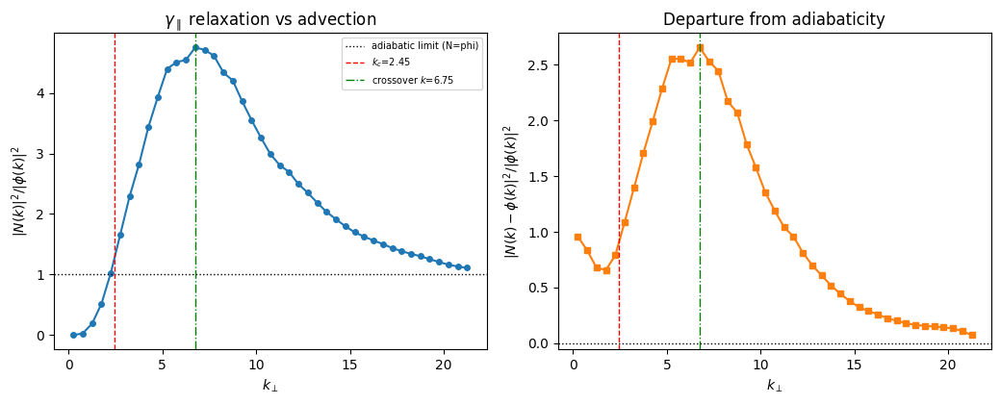

In [12]:
# time-averaged shell profiles of |N|^2/|phi|^2 and |N-phi|^2/|phi|^2 over the SAME
# saturation window/moments already accumulated in the cross-phase cell above (N2_acc,
# phi2_acc, cre_acc) -- reused directly, not rederived, so this is exactly consistent with
# it.
adiab_ratio = N2_acc / np.where(phi2_acc > 0, phi2_acc, np.nan)          # |N|^2/|phi|^2
diff2_acc = N2_acc + phi2_acc - 2*cre_acc                                # |N-phi|^2 moment
adiab_diff = diff2_acc / np.where(phi2_acc > 0, phi2_acc, np.nan)        # |N-phi|^2/|phi|^2

valid = ~np.isnan(adiab_ratio)
i_peak = np.nanargmax(adiab_ratio)
k_peak, peak_val = kb_cp[i_peak], adiab_ratio[i_peak]
i_cut = np.where(valid)[0][-1]
print(f"gamma_parallel-relaxation crossover (peak of |N|^2/|phi|^2): "
     f"k = {k_peak:.2f}, peak value = {peak_val:.2f}")
print(f"at the last resolved bin (k={kb_cp[i_cut]:.2f}, ~dealias cutoff): "
     f"|N|^2/|phi|^2 = {adiab_ratio[i_cut]:.2f}, |N-phi|^2/|phi|^2 = {adiab_diff[i_cut]:.3f}")

fig, axes = plt.subplots(1, 2, figsize=(10.5, 4.3))
axes[0].plot(kb_cp[valid], adiab_ratio[valid], "o-", ms=4)
axes[0].axhline(1.0, color="k", ls=":", lw=1, label="adiabatic limit (N=phi)")
axes[0].axvline(kc, color="r", ls="--", lw=1, label=fr"$k_c$={kc:.2f}")
axes[0].axvline(k_peak, color="g", ls="-.", lw=1, label=fr"crossover $k$={k_peak:.2f}")
axes[0].set_xlabel(r"$k_\perp$"); axes[0].set_ylabel(r"$|N(k)|^2/|\phi(k)|^2$")
axes[0].set_title(r"$\gamma_\parallel$ relaxation vs advection")
axes[0].legend(fontsize=7)

axes[1].plot(kb_cp[valid], adiab_diff[valid], "s-", ms=4, color="C1")
axes[1].axhline(0.0, color="k", ls=":", lw=1)
axes[1].axvline(kc, color="r", ls="--", lw=1)
axes[1].axvline(k_peak, color="g", ls="-.", lw=1)
axes[1].set_xlabel(r"$k_\perp$"); axes[1].set_ylabel(r"$|N(k)-\phi(k)|^2/|\phi(k)|^2$")
axes[1].set_title("Departure from adiabaticity")
plt.tight_layout()

Measured (not asserted): $|N|^2/|\phi|^2$ rises from $\ll1$ at the largest scales, peaks
around $k_\perp\approx6.75$ at a value of order a few ($\approx4.75$), then *decreases*
back toward 1 as $k_\perp$ increases further, slightly overshooting to $\approx1.11$ at the
last resolved bin ($k_\perp\approx21.25$, near the dealias cutoff) -- the
"$\gamma_\parallel$-relaxation crossover" the discussion above anticipated, now measured
directly rather than inferred from the strong-drive family's numbers. It sits further out
than the earlier strong-drive family's crossover ($k_\perp\approx4$-$5$) and its peak value
is far smaller (order a few here vs. $\approx33$ there) -- both consistent with the weaker
drive: `nu_in` roughly 28x smaller pushes $\gamma_\parallel(k)=\nu_{in}k^2$ out to much
larger $k$ before it matters as much, and the overall turbulence is far less vigorously
stirred. $|N-\phi|^2/|\phi|^2$ tracks the same story from the other side: it falls steadily
past the crossover, down to $\approx0.07$ (a few percent) by the dealias cutoff -- getting
close to the adiabatic limit ($N\approx\phi$) as $k_\perp$ increases, and at this
calibration point the resolved range (out to $k_\perp\approx21$) very nearly reaches full
adiabaticity, closer than either earlier family got. Both diagnostics are internally
consistent (same accumulated moments as the cross-phase cell above) and consistent with
each other's story: this 2D-closure run's small scales are *more* adiabatic than its large
scales, and nearly (if not quite) fully adiabatic at the smallest resolved scales -- exactly
the qualitative picture the "why does the spectrum extend beyond $k_c$" discussion above
needs to be true for its cascade interpretation to hold.

### Notes / things to try

- **P4b**: this is still the 2D closure only; the real parallel-diffusivity axis
  (`z_spectral`, $D_\parallel k_z^2$) arrives with 3D GDI and is the only way to test the
  paper's actual small-scale drift-wave mechanism (see the discussion above).
- **Weak- vs strong-drive**: this notebook's `Ln=392, v0=25, nu_in=0.0106` family was
  picked from a direct $\gamma_{max}$-calibration (see the intro above), targeting
  $\max\delta n/n\sim0.3$; try the intermediate first-retune family
  (`Ln=84, v0=25, nu_in=0.05`, same box) to see the mixing-length-in-$L_n$ estimate
  undershoot the target ($\max|N|\sim1.3$-$1.8$ there vs. $\sim0.35$-$0.52$ here), or the
  original strong-drive family (`Ln=1, nu_in=0.3, v0=2, diss=2e-5`, same box) to see the
  ordering break down entirely ($N_{rms}$ an order of magnitude larger, cross-phase/
  amplitude-ratio departures in the *opposite* direction from what's measured above).
- **`gpar_fac`**: the 2D closure floor $\gamma_\parallel=\text{gpar\_fac}\cdot\nu_{in}\cdot
  k_\perp^2$ (eq 4.3) has no intrinsic justification for its exact value away from the
  marginal-stability estimate; try a few values and watch `kc`/the unstable-mode count and
  the growth-rate map shift (recompute the parameter cell above -- it is designed to be
  re-run cheaply, without simulating anything).
- **`diss`/`hyper`**: convergence in the perpendicular hyperdissipation should be checked
  in any production run (the model has no small-scale cutoff of its own, eq 3.14) -- try
  raising `diss` if a longer/finer run piles energy up against the dealias cutoff, or
  lowering it if the cascade dies out before using the available range.
- **Resolution**: doubling `NX`/`NY` at fixed box roughly doubles the dealiased range
  beyond $k_c$ (more room for the cascade) at the cost of ~4x the per-step cost; `LX`/`LY`
  instead controls how many *unstable* lattice modes exist at fixed physical $k_c$.

### Animated evolution: $N$ and $\nabla_\perp^2\phi$

Renders every saved snapshot as a side-by-side frame ($N$ left, vorticity
$\nabla_\perp^2\phi$ right, each frame's own symmetric color scale) and assembles them
into a GIF via `gdi_2d_run.make_gif` (idempotent: skips regenerating if a GIF newer than
the last snapshot already exists). Written inside the snapshot directory
(`data/gdi-2D/gdi-2D-evolution.gif`) so it is gitignored along with the rest of the data.

make_gif: data/gdi-2D/gdi-2D-evolution.gif already up to date (62 snapshots), skipping


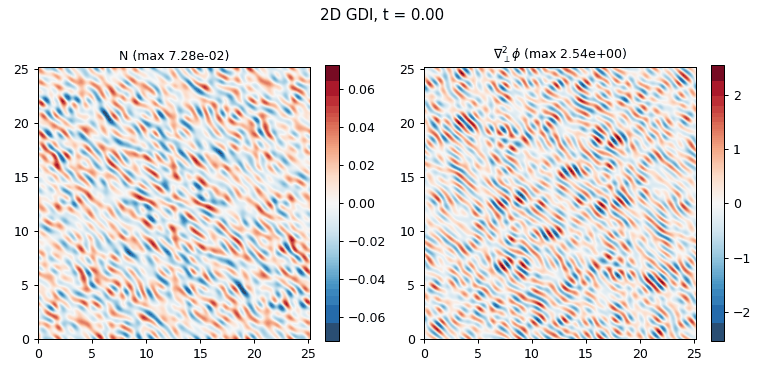

In [13]:
from IPython.display import Image as IPyImage, display
from gdi_2d_run import make_gif

gif_path = make_gif(snap_path)
display(IPyImage(filename=gif_path))